In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import torch
import shutil ## copying , deleting file
import os
import matplotlib.colors as mcolors
import seaborn as sns
import yaml
import cv2
import matplotlib
import matplotlib.pyplot as plt
import kagglehub
import shutil
from tqdm.notebook import tqdm
from glob import glob 
from PIL import Image
from collections import Counter
from os import listdir
from os.path import isfile, join
from IPython.display import Image, clear_output
from sklearn.model_selection import GroupKFold
import albumentations as A

import kagglehub
import warnings
warnings.filterwarnings("ignore", category=UserWarning)


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [4]:

path = kagglehub.dataset_download("awsaf49/vinbigdata-512-image-dataset")



In [5]:
vinbigdata_yolo_labels_dataset_path = kagglehub.dataset_download('awsaf49/vinbigdata-yolo-labels-dataset')

In [6]:
train_df = pd.read_csv('/kaggle/input/vinbigdata-512-image-dataset/vinbigdata/train.csv')
train_df.sample(5)

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height
13271,34e46f1de88c1daada3300ac78c9cc88,No finding,14,R9,NaN,NaN,NaN,NaN,2048,2500
42264,7acf032984e0dde6b0cce4a429c1c8ee,No finding,14,R17,NaN,NaN,NaN,NaN,3072,3072
3601,91dcbfac33b20bb82e9641211b18f53b,Nodule/Mass,8,R10,584.0,1780.0,621.0,1838.0,2540,3072
65494,1df3aeacf7d82652fd03b4e54fde89c4,No finding,14,R4,NaN,NaN,NaN,NaN,2540,3072
13035,d97a50b79123ba7bca96e8105bfb6ef8,No finding,14,R7,NaN,NaN,NaN,NaN,2336,2836


In [7]:
train_df.shape

(67914, 10)

In [8]:
index = train_df[train_df["class_name"] == 'No finding'].index

In [9]:
train_df = train_df.drop(index)
train_df = train_df.reset_index(drop=True)

In [10]:
train_df.shape

(36096, 10)

In [11]:
dim=512
train_df['file_path'] = f'/kaggle/input/vinbigdata-512-image-dataset/vinbigdata/train/'+train_df.image_id+('.png' if dim!='original' else '.jpg')
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,file_path
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,2080,2336,/kaggle/input/vinbigdata-512-image-dataset/vin...
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0,2304,2880,/kaggle/input/vinbigdata-512-image-dataset/vin...
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,627.0,357.0,947.0,433.0,2540,3072,/kaggle/input/vinbigdata-512-image-dataset/vin...
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,1347.0,245.0,2188.0,2169.0,2285,2555,/kaggle/input/vinbigdata-512-image-dataset/vin...
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,557.0,2352.0,675.0,2484.0,2568,3353,/kaggle/input/vinbigdata-512-image-dataset/vin...


In [12]:
(train_df.class_id == 'NaN').sum()

0

Image shape: (512, 512)


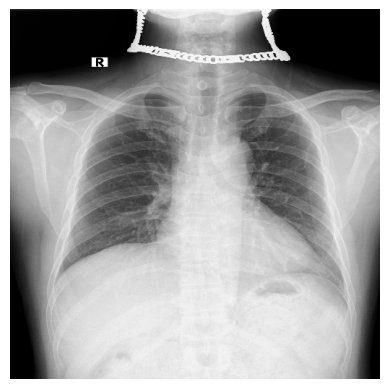

In [13]:
from matplotlib import pyplot as plt
import matplotlib.image as mpimg

image_path = '/kaggle/input/vinbigdata-512-image-dataset/vinbigdata/train/000434271f63a053c4128a0ba6352c7f.png'

image = mpimg.imread(image_path)
print("Image shape:", image.shape)

plt.imshow(image, cmap='gray')
plt.axis('off')
plt.show()


In [14]:
train_df.columns

Index(['image_id', 'class_name', 'class_id', 'rad_id', 'x_min', 'y_min',
       'x_max', 'y_max', 'width', 'height', 'file_path'],
      dtype='object')

In [15]:
train_new = pd.DataFrame()
train_new = train_df.copy()

In [16]:
train_df['x_max'] = train_df.apply(lambda row: (row.x_max)/row.width, axis =1)
train_df['x_min'] = train_df.apply(lambda row: (row.x_min)/row.width, axis =1)

train_df['y_max'] = train_df.apply(lambda row: (row.y_max)/row.height, axis =1)
train_df['y_min'] = train_df.apply(lambda row: (row.y_min)/row.height, axis =1)

train_df['x_mid'] = train_df.apply(lambda row: (row.x_max + row.x_min)/2 , axis=1)
train_df['y_mid'] = train_df.apply(lambda row: (row.y_max + row.y_min)/2 , axis=1)

In [17]:
train_df.sample(5)

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,file_path,x_mid,y_mid
6147,34b63ee871b59cc84249bc3c3ec8a4bf,Pulmonary fibrosis,13,R8,0.728190,0.391927,0.772135,0.437174,3072,3072,/kaggle/input/vinbigdata-512-image-dataset/vin...,0.750163,0.414551
34804,0760a14308badcbd370c6866c9db3a0a,Lung Opacity,7,R10,0.612199,0.171068,0.680346,0.256455,2656,3408,/kaggle/input/vinbigdata-512-image-dataset/vin...,0.646273,0.213762
7785,4ef589fee1b30a47d9955e4613cf901c,Pulmonary fibrosis,13,R8,0.746578,0.475630,0.831386,0.590252,2995,2975,/kaggle/input/vinbigdata-512-image-dataset/vin...,0.788982,0.532941
19654,481d58f636bb1d5b6d568e190b172a57,Cardiomegaly,3,R9,0.362676,0.572614,0.856221,0.746888,1704,1928,/kaggle/input/vinbigdata-512-image-dataset/vin...,0.609448,0.659751
28824,2da795e38db0e7086e2479f7aaf1e631,Infiltration,6,R9,0.343099,0.162610,0.501953,0.407370,3072,2958,/kaggle/input/vinbigdata-512-image-dataset/vin...,0.422526,0.284990


In [18]:
(train_df["class_id"] == 14).sum()


0

In [19]:
class_name = train_df[['class_name']].value_counts()
list_label = class_name
list_label

class_name        
Aortic enlargement    7162
Cardiomegaly          5427
Pleural thickening    4842
Pulmonary fibrosis    4655
Nodule/Mass           2580
Lung Opacity          2483
Pleural effusion      2476
Other lesion          2203
Infiltration          1247
ILD                   1000
Calcification          960
Consolidation          556
Atelectasis            279
Pneumothorax           226
Name: count, dtype: int64

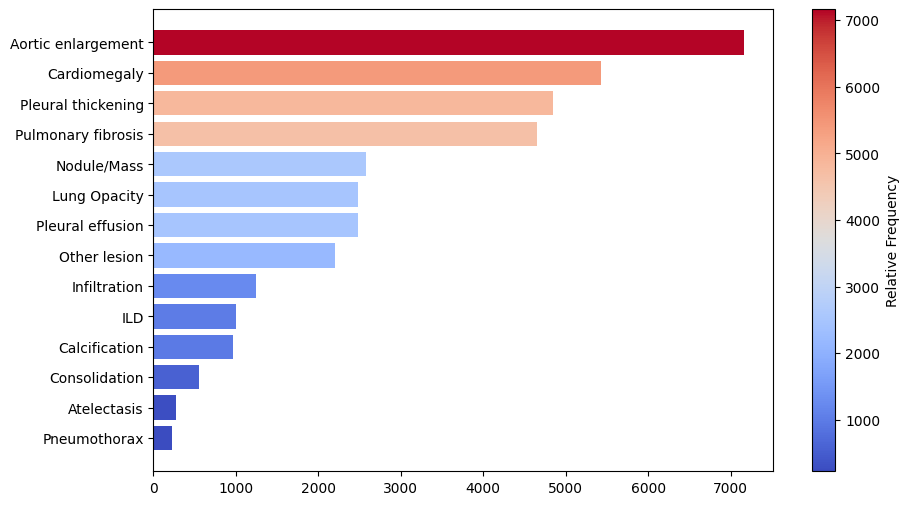

In [20]:
series = pd.Series({
    "Aortic enlargement": 7162,
    "Cardiomegaly": 5427,
    "Pleural thickening": 4842,
    "Pulmonary fibrosis": 4655,
    "Nodule/Mass": 2580,
    "Lung Opacity": 2483,
    "Pleural effusion": 2476,
    "Other lesion": 2203,
    "Infiltration": 1247,
    "ILD": 1000,
    "Calcification": 960,
    "Consolidation": 556,
    "Atelectasis": 279,
    "Pneumothorax": 226,
})

df = series.reset_index()
df.columns = ['class_name', 'count']
list_class_name = df['class_name'].tolist()
list_count = df['count'].tolist()

# Normalize for color mapping
normalize = (df['count'] - min(df['count'])) / (max(df['count']) - min(df['count']))
cmap = plt.cm.coolwarm
colors = cmap(normalize)

# Create plot
fig, ax = plt.subplots(figsize=(10,6))
bars = ax.barh(list_class_name, list_count, color=colors)
ax.invert_yaxis()  # Reverse y-axis for better visualization

# Create a ScalarMappable object for the colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min(list_count), vmax=max(list_count)))
sm.set_array([])  # Necessary to avoid error


cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Relative Frequency')

plt.show()


In [21]:
transform = A.Compose([
    A.HorizontalFlip(p=0.2),
    A.Rotate(limit = 90, p = 0.2),
    A.RandomBrightnessContrast(p = 0.2),
    A.GaussNoise(var_limit = (10,40), p = 0.2),
    A.GaussianBlur(blur_limit = (3, 7), p = 0.2)]
)

In [22]:
list_class_name

['Aortic enlargement',
 'Cardiomegaly',
 'Pleural thickening',
 'Pulmonary fibrosis',
 'Nodule/Mass',
 'Lung Opacity',
 'Pleural effusion',
 'Other lesion',
 'Infiltration',
 'ILD',
 'Calcification',
 'Consolidation',
 'Atelectasis',
 'Pneumothorax']

In [23]:
gkf = GroupKFold(n_splits = 5)
train_df['fold'] = -1
cou = 0
for fold, (train_idx, val_idx) in enumerate(gkf.split(train_df, groups = train_df.image_id.tolist())):
    train_df.loc[val_idx, 'fold'] = fold

In [24]:
train_files = []
val_files = []
val_files+= list(train_df[train_df['fold']==fold].file_path.unique())
train_files+= list(train_df[train_df['fold']!=fold].file_path.unique())
train_files[0]

'/kaggle/input/vinbigdata-512-image-dataset/vinbigdata/train/9a5094b2563a1ef3ff50dc5c7ff71345.png'

In [25]:
train_df['w'] = (train_df['x_min']+train_df['x_max'])/2
train_df['h'] = (train_df['y_min']+train_df['y_max'])/2
train_df = train_df[['class_id', 'x_mid', 'y_mid', 'w', 'h']]
train_df

,class_id,x_mid,y_mid,w,h
0,3,0.563462,0.686216,0.563462,0.686216
1,0,0.623915,0.305903,0.623915,0.305903
2,11,0.309843,0.128581,0.309843,0.128581
3,5,0.773523,0.472407,0.773523,0.472407
4,8,0.239875,0.721145,0.239875,0.721145
...,...,...,...,...,...
36091,10,0.174045,0.616493,0.174045,0.616493
36092,13,0.407064,0.281250,0.407064,0.281250
36093,5,0.266846,0.434400,0.266846,0.434400
36094,9,0.060330,0.417708,0.060330,0.417708


In [36]:
os.makedirs('/kaggle/working/config/images/train/', exist_ok = True)
os.makedirs('/kaggle/working/config/images/val/', exist_ok = True)
os.makedirs('/kaggle/working/config/labels/train/', exist_ok = True)
os.makedirs('/kaggle/working/config/labels/val/', exist_ok = True)

In [37]:

path = kagglehub.dataset_download("awsaf49/vinbigdata-yolo-labels-dataset")



In [38]:
label_dir = '/kaggle/input/vinbigdata-yolo-labels-dataset/labels/'

for file in train_files:
    shutil.copy(file,'/kaggle/working/config/images/train/')
    filename = file.split('/')[-1].split('.')[0]
    shutil.copy(os.path.join(label_dir, filename + '.txt'), '/kaggle/working/config/labels/train/')

for file in val_files:
    shutil.copy(file, '/kaggle/working/config/images/val/')
    filename = file.split('/')[-1].split('.')[0]
    shutil.copy(os.path.join(label_dir,filename+'.txt'), '/kaggle/working/config/labels/val/')

In [39]:
cwd = '/kaggle/working/'

with open(join(cwd, 'train.txt'),'w') as f:
    for file in glob('/kaggle/working/config/images/train/*'):
        f.write(file+'\n')

with open(join(cwd, 'val.txt'),'w') as f:
    for file in glob('/kaggle/working/config/images/val/*'):
        f.write(file+'\n')

In [42]:
data = dict(
    train =  join(cwd, 'train.txt'),
    val   =  join(cwd, 'val.txt'),
    nc    = 14,
    names = list_class_name
    )

with open(join('/kaggle/working/', 'config.yaml'), 'w') as outfile:
    yaml.dump(data, outfile, default_flow_style=False)

f = open(join('/kaggle/working/' , 'config.yaml'), 'r')
print('\nyaml:')
print(f.read())


yaml:
names:
- Aortic enlargement
- Cardiomegaly
- Pleural thickening
- Pulmonary fibrosis
- Nodule/Mass
- Lung Opacity
- Pleural effusion
- Other lesion
- Infiltration
- ILD
- Calcification
- Consolidation
- Atelectasis
- Pneumothorax
nc: 14
train: /kaggle/working/train.txt
val: /kaggle/working/val.txt



In [43]:

from ultralytics import YOLO

print("GPUs available:", torch.cuda.device_count())

os.environ["CUDA_VISIBLE_DEVICES"] = "0,1"

model = YOLO("yolov8x.pt")  


model.train(
    data="/kaggle/working/config.yaml",
    epochs=30,
    imgsz=640,
    batch=16,
    device=[0, 1], 
)


GPUs available: 2
Ultralytics 8.3.102 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
                                                        CUDA:1 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8x.pt, data=/kaggle/working/config.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=[0, 1], workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_f

100%|██████████| 755k/755k [00:00<00:00, 17.5MB/s]


Overriding model.yaml nc=80 with nc=14

                   from  n    params  module                                       arguments                     
  0                  -1  1      2320  ultralytics.nn.modules.conv.Conv             [3, 80, 3, 2]                 
  1                  -1  1    115520  ultralytics.nn.modules.conv.Conv             [80, 160, 3, 2]               
  2                  -1  3    436800  ultralytics.nn.modules.block.C2f             [160, 160, 3, True]           
  3                  -1  1    461440  ultralytics.nn.modules.conv.Conv             [160, 320, 3, 2]              
  4                  -1  6   3281920  ultralytics.nn.modules.block.C2f             [320, 320, 6, True]           
  5                  -1  1   1844480  ultralytics.nn.modules.conv.Conv             [320, 640, 3, 2]              
  6                  -1  6  13117440  ultralytics.nn.modules.block.C2f             [640, 640, 6, True]           
  7                  -1  1   3687680  ultralytic

In [ ]:
import shutil

shutil.copy(results.save_dir + "/best.pt", "/kaggle/working/yolov8_best_model.pt")


In [49]:
source_path = "/kaggle/working/runs/detect/train2/weights/best.pt"  
destination_path = "/kaggle/working/yolov8_best_model.pt"  
shutil.copy(source_path, destination_path)

print(f"✅ Model saved at: {destination_path}")


✅ Model saved at: /kaggle/working/yolov8_best_model.pt


In [55]:
source_path = 'runs/detect/train2' 
destination_path = 'full_dir'      
shutil.copytree(source_path, destination_path)
print(f"✅ Full directory saved at destination path: {destination_path}")


✅ Full directory saved at destination path: full_dir


Text(0.5, 1.0, 'Training Metrics (Loss/Accuracy Curves)')

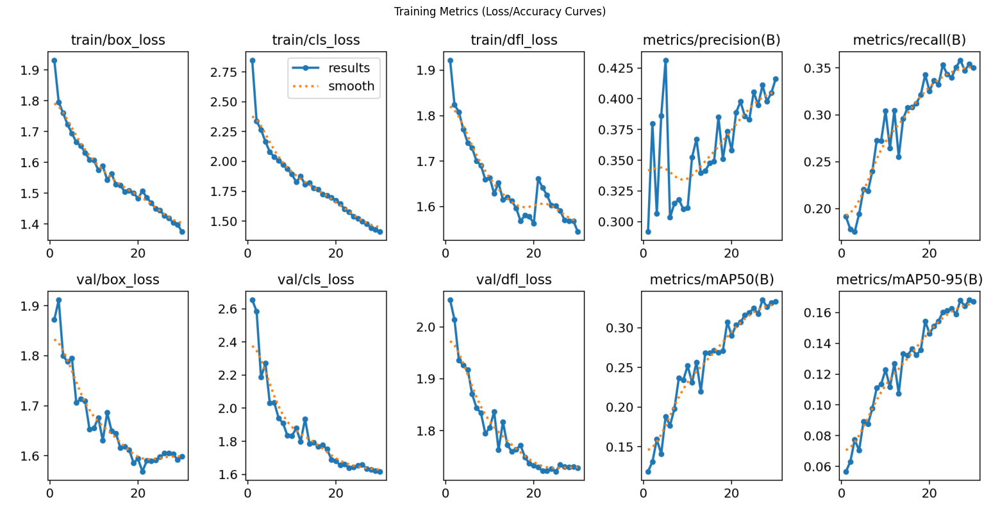

In [74]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
plt.figure(figsize=(20, 10))
plt.imshow(mpimg.imread('/kaggle/working/full_dir/results.png'))
plt.axis('off')
plt.title("Training Metrics (Loss/Accuracy Curves)")


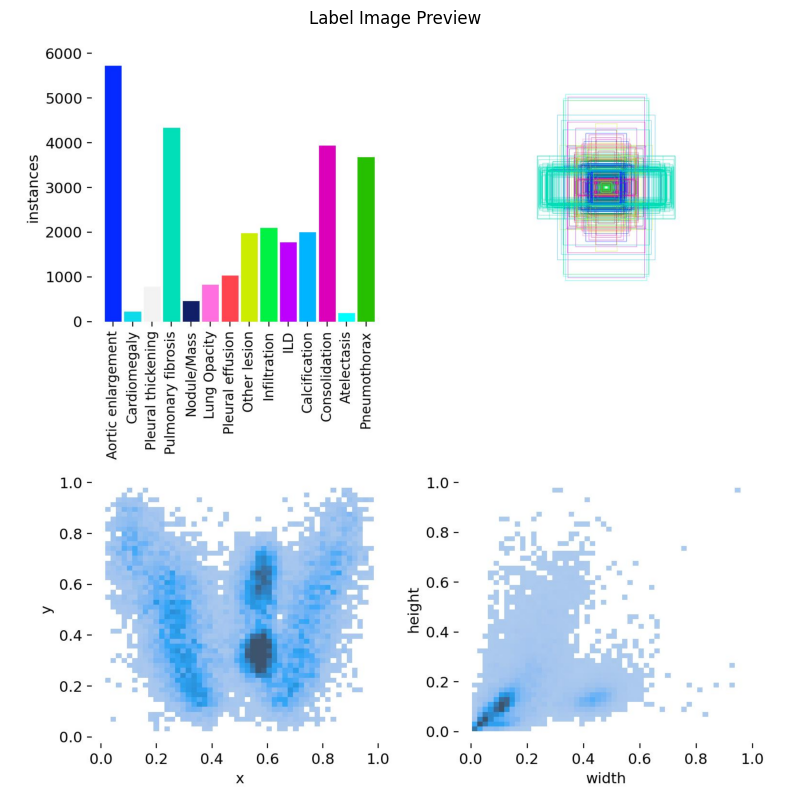

In [75]:
label_img_path = '/kaggle/working/full_dir/labels.jpg'
os.path.exists(label_img_path)
plt.figure(figsize=(10, 10))
plt.imshow(plt.imread(label_img_path))
plt.title("Label Image Preview")
plt.axis('off')
plt.show()



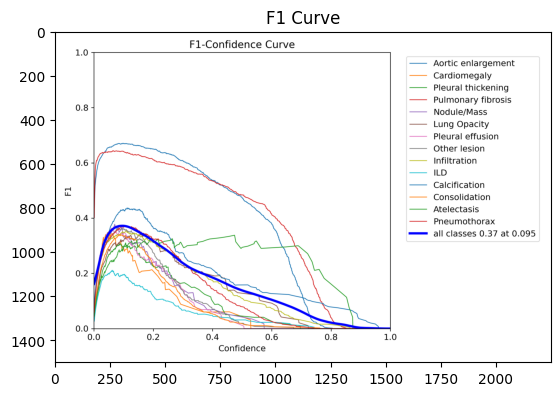

In [76]:
image_path = "/kaggle/working/runs/detect/train2/F1_curve.png"
plt.imshow(plt.imread(image_path))
plt.title("F1 Curve")
plt.show()


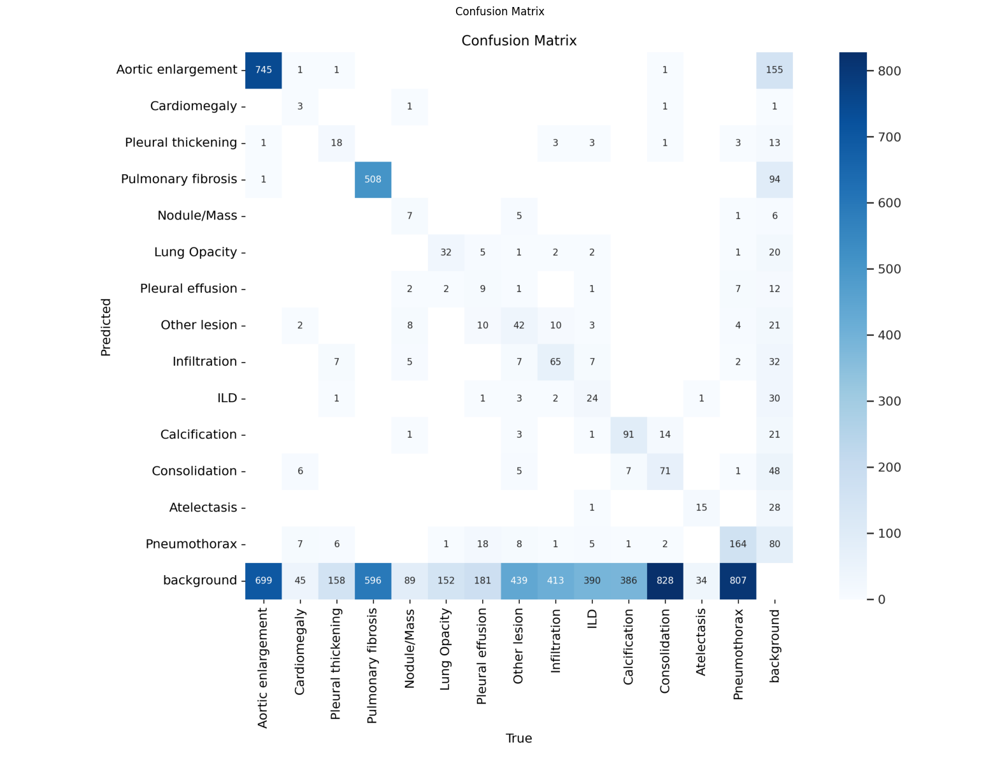

In [77]:
plt.figure(figsize=(20, 20))
plt.imshow(plt.imread('/kaggle/working/runs/detect/train2/confusion_matrix.png'))
plt.axis('off')
plt.title("Confusion Matrix")
plt.show()


Text(0.5, 1.0, 'Train Batch 2')

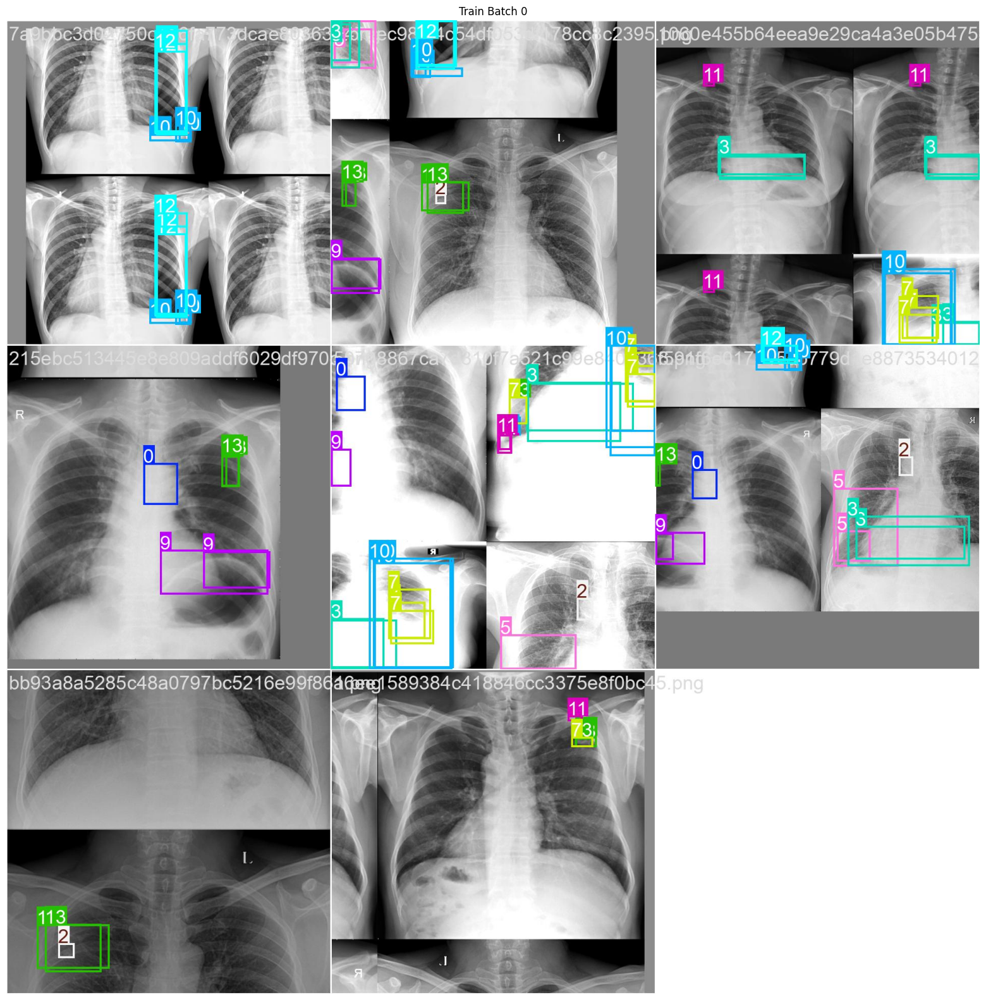

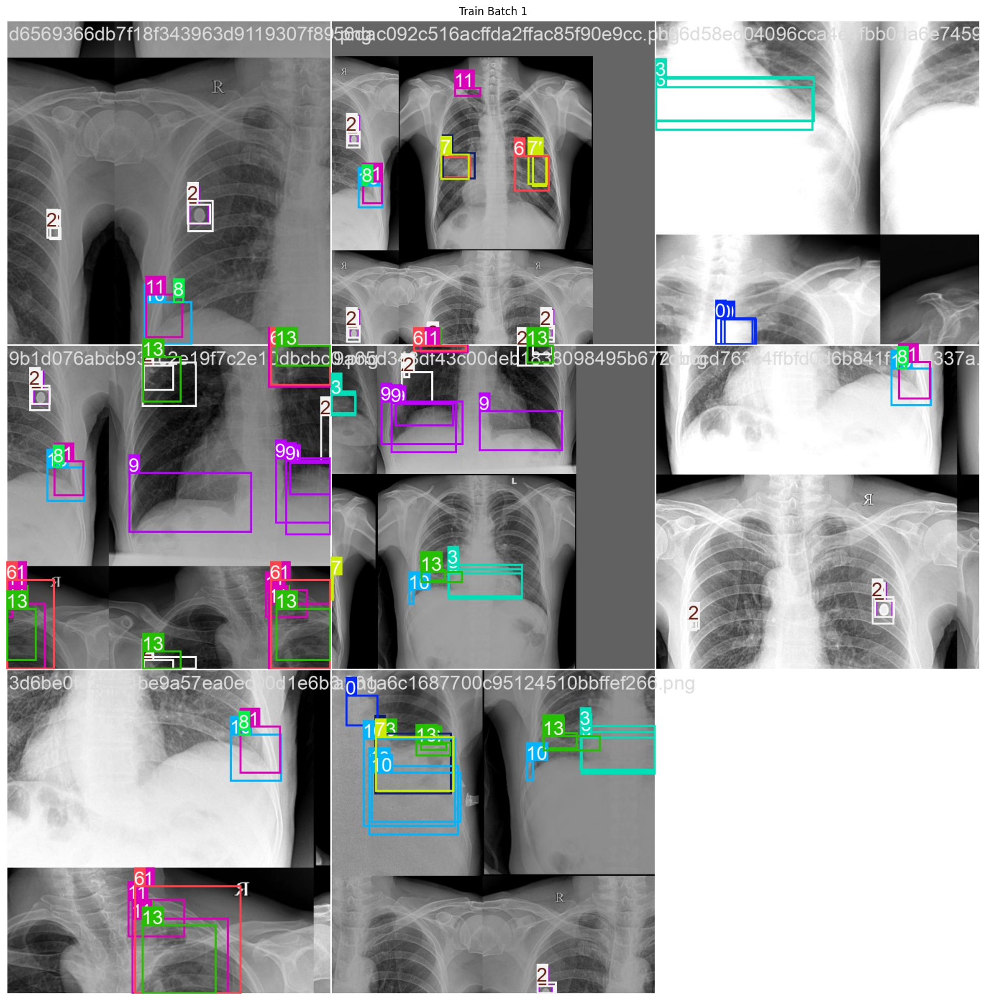

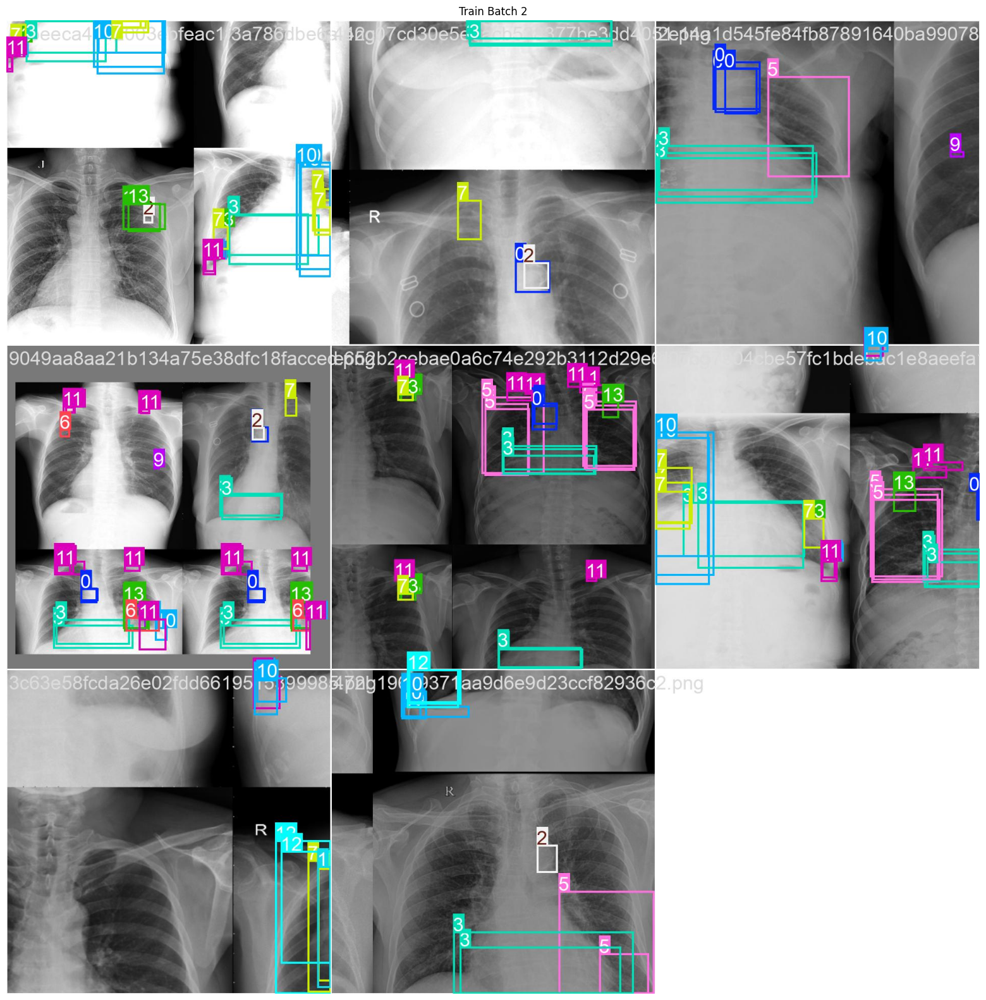

In [78]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
plt.figure(figsize=(20, 20))
plt.imshow(mpimg.imread('full_dir/train_batch0.jpg'))
plt.axis('off')
plt.title("Train Batch 0")

plt.figure(figsize=(20, 20))
plt.imshow(mpimg.imread('full_dir/train_batch1.jpg'))
plt.axis('off')
plt.title("Train Batch 1")

plt.figure(figsize=(20, 20))
plt.imshow(mpimg.imread('full_dir/train_batch2.jpg'))
plt.axis('off')
plt.title("Train Batch 2")


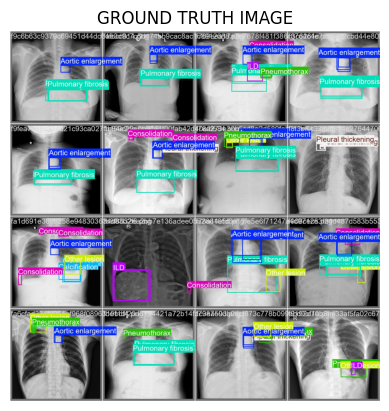

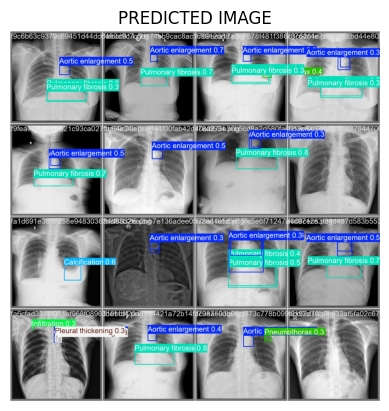

In [79]:
fig, ax = plt.subplots(1, 1)
ax.imshow(plt.imread('/kaggle/working/full_dir/val_batch0_labels.jpg'))
ax.set_title('GROUND TRUTH IMAGE')
ax.set_axis_off()

fig, ax = plt.subplots(1, 1)
ax.imshow(plt.imread('/kaggle/working/full_dir/val_batch0_pred.jpg'))
ax.set_title('PREDICTED IMAGE')
ax.set_axis_off()


(-0.5, 1999.5, 1999.5, -0.5)

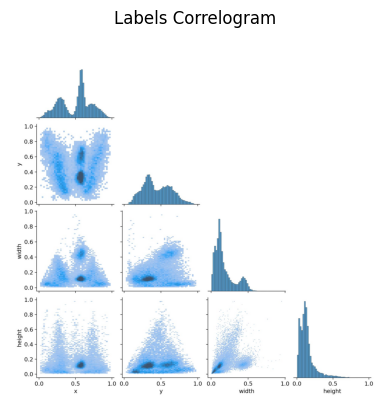

In [80]:
plt.imshow(plt.imread('/kaggle/working/full_dir/labels_correlogram.jpg'))
plt.title("Labels Correlogram")
plt.axis('off')


In [81]:
model = YOLO('/kaggle/working/runs/detect/train2/weights/best.pt')
results = model.predict(source='/kaggle/input/vinbigdata-512-image-dataset/vinbigdata/test', save=True, conf=0.25)




WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/3000 /kaggle/input/vinbigdata-512-image-dataset/vinbigdata/test/002a34c58c5b758217ed1f584ccbcfe9.png: 640x640 1 Pulmonary fibrosis, 96.4ms
image 2/3000 /kaggle/input/vinbigdata-512-image-dataset/vinbigdata/test/004f33259ee4aef671c2b95d54e4be68.png: 640x640 2 Aortic enlargements, 78.1ms
image 3/3000 /kaggle/input/vinbigdata-512-image-dataset/vinbigdata/test/008bdde2af2462e86fd373a445d0f4cd.png: 640x640 2 Aortic enlargements, 1 Pulmonary fibrosis

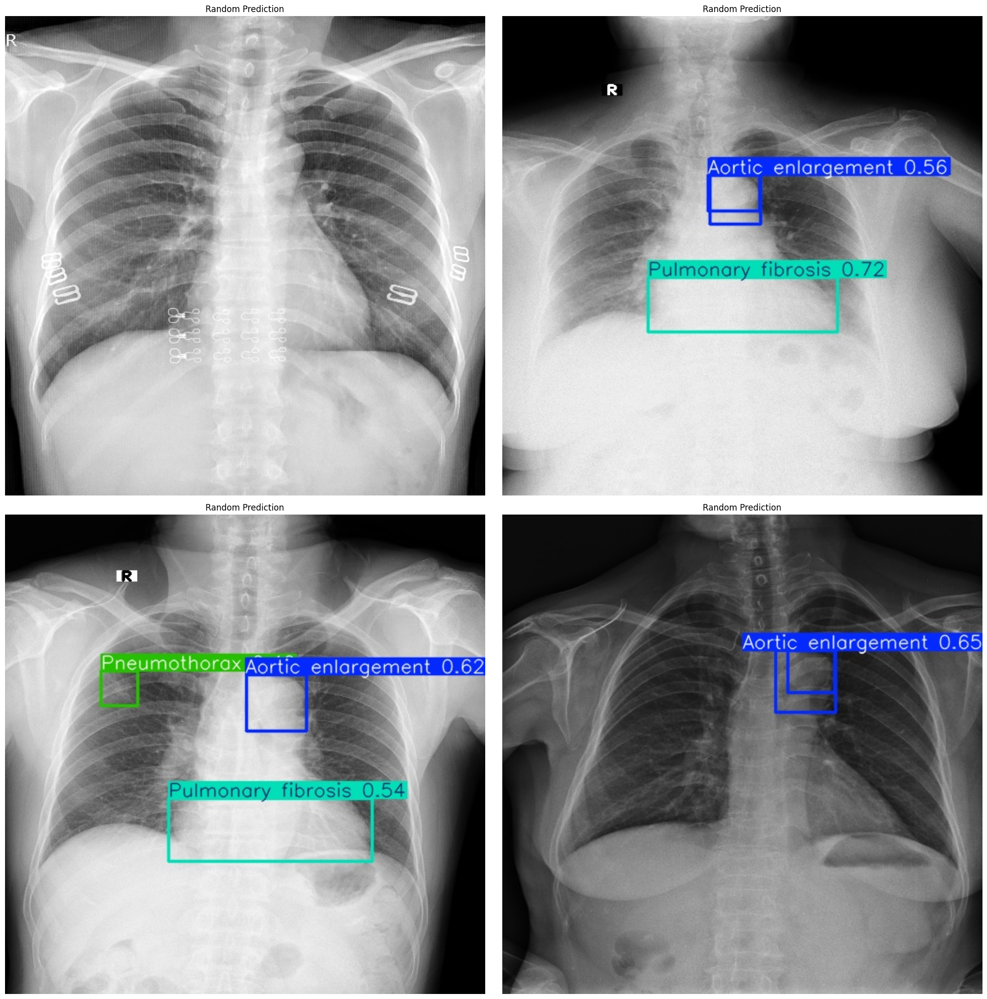

In [82]:

pred_dir = '/kaggle/working/runs/detect/predict'

# Get only image files
pred_images = [f for f in os.listdir(pred_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

# Randomly sample 4 predictions
sample_images = random.sample(pred_images, 4)

plt.figure(figsize=(20, 20))
for i, img_file in enumerate(sample_images):
    img = Image.open(os.path.join(pred_dir, img_file))
    plt.subplot(2, 2, i + 1)
    plt.imshow(img)
    plt.title(f"Random Prediction")
    plt.axis('off')
plt.tight_layout()
plt.show()
